In [0]:
import pandas as pd 
df_read = pd.read_csv("/Volumes/workspace/default/netflix/NETFLIX_TITLES/cleaned_netflix_titles.csv")
display(df_read)


show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,directory
s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra Duah, Nick Medley, Mutabaruka, Afemo Omilami, Reggie Carter, Mzuri",United States Ghana Burkina Faso United Kingdom Germany Ethiopia,"September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model slips back in time, becomes enslaved on a plantation and bears witness to the agony of her ancestral past.",haile gerima
s9,TV Show,The Great British Baking Show,Andy Devonshire,"Mel Giedroyc, Sue Perkins, Mary Berry, Paul Hollywood",United Kingdom,"September 24, 2021",2021,TV-14,9 Seasons,"British TV Shows, Reality TV","A talented batch of amateur bakers face off in a 10-week competition, whipping up their best dishes in the hopes of being named the U.K.'s best.",andy devonshire
s10,Movie,The Starling,Theodore Melfi,"Melissa McCarthy, Chris O'Dowd, Kevin Kline, Timothy Olyphant, Daveed Diggs, Skyler Gisondo, Laura Harrier, Rosalind Chao, Kimberly Quinn, Loretta Devine, Ravi Kapoor",United States,"September 24, 2021",2021,PG-13,104 min,"Comedies, Dramas",A woman adjusting to life after a loss contends with a feisty bird that's taken over her garden — and a husband who's struggling to find a way forward.,theodore melfi
s13,Movie,Je Suis Karl,Christian Schwochow,"Luna Wedler, Jannis Niewöhner, Milan Peschel, Edin Hasanović, Anna Fialová, Marlon Boess, Victor Boccard, Fleur Geffrier, Aziz Dyab, Mélanie Fouché, Elizaveta Maximová",Germany Czech Republic,"September 23, 2021",2021,TV-MA,127 min,"Dramas, International Movies","After most of her family is murdered in a terrorist bombing, a young woman is unknowingly lured into joining the very group that killed them.",christian schwochow
s25,Movie,Jeans,S. Shankar,"Prashanth, Aishwarya Rai Bachchan, Sri Lakshmi, Nassar",India,"September 21, 2021",1998,TV-14,166 min,"Comedies, International Movies, Romantic Movies","When the father of the man she loves insists that his twin sons marry twin sisters, a woman creates an alter ego that might be a bit too convincing.",s. shankar
s28,Movie,Grown Ups,Dennis Dugan,"Adam Sandler, Kevin James, Chris Rock, David Spade, Rob Schneider, Salma Hayek, Maria Bello, Maya Rudolph, Colin Quinn, Tim Meadows, Joyce Van Patten",United States,"September 20, 2021",2010,PG-13,103 min,Comedies,"Mourning the loss of their beloved junior high basketball coach, five middle-aged pals reunite at a lake house and rediscover the joys of being a kid.",dennis dugan
s29,Movie,Dark Skies,Scott Stewart,"Keri Russell, Josh Hamilton, J.K. Simmons, Dakota Goyo, Kadan Rockett, L.J. Benet, Rich Hutchman, Myndy Crist, Annie Thurman, Jake Brennan",United States,"September 19, 2021",2013,PG-13,97 min,"Horror Movies, Sci-Fi & Fantasy","A family’s idyllic suburban life shatters when an alien force invades their home, and as they struggle to convince others of the deadly threat.",scott stewart
s30,Movie,Paranoia,Robert Luketic,"Liam Hemsworth, Gary Oldman, Amber Heard, Harrison Ford, Lucas Till, Embeth Davidtz, Julian McMahon, Josh Holloway, Richard Dreyfuss, Angela Sarafyan",United States India France,"September 19, 2021",2013,PG-13,106 min,Thrillers,"Blackmailed by his company's CEO, a low-level employee finds himself forced to spy on the boss's rival and former mentor.",robert luketic
s39,Movie,Birth of the Dragon,George Nolfi,"Billy Magnussen, Ron Yuan, Qu Jingjing, Terry Chen, Vanness Wu, Jin Xing, Philip Ng, Xia Yu, Yu Xia",China Canada United States,"September 16, 2021",2017,PG-13,96 min,"Action & Adventure, Dramas","A young Bruce Lee angers kung fu traditionalists by teaching outsiders, leading to a showdown with a Shaolin master in this film based on real events.",george nolfi
s42,Movie,Jaws,Steven Spielberg,"Roy Scheider, Robert Shaw, Richard Dreyfuss, Lorraine Gary, Murray Hamilton, Carl Gottlieb, Jeffrey Kramer, Susan Back

In [0]:
# Check available columns
print("Available columns:", df_read.columns)

# Proceed only if 'genre' and 'rating' exist
if 'genre' in df_read.columns and 'rating' in df_read.columns:
    from sklearn.preprocessing import LabelEncoder, StandardScaler
    from sklearn.cluster import KMeans

    # Encode categorical columns
    le_genre = LabelEncoder()
    le_rating = LabelEncoder()
    df_read['genre_index'] = le_genre.fit_transform(df_read['genre'])
    df_read['rating_index'] = le_rating.fit_transform(df_read['rating'])

    # Assemble features
    features = df_read[['genre_index', 'duration', 'rating_index']]

    # Scale features
    scaler = StandardScaler()
    scaled_features = scaler.fit_transform(features)

    # KMeans clustering
    kmeans = KMeans(n_clusters=5, random_state=1)
    df_read['prediction'] = kmeans.fit_predict(scaled_features)

    display(df_read[['title', 'genre', 'duration', 'rating', 'prediction']])
else:
    print("Missing required columns: 'genre' and/or 'rating'")

Available columns: Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description',
       'directory'],
      dtype='object')
Missing required columns: 'genre' and/or 'rating'


In [0]:
display(pd.DataFrame({'columns': df_read.columns}))

columns
show_id
type
title
director
cast
country
date_added
release_year
rating
duration


In [0]:
from sklearn.preprocessing import MultiLabelBinarizer, StandardScaler
from sklearn.cluster import KMeans

# Prepare genre features
mlb = MultiLabelBinarizer()
genres = df_read['listed_in'].str.split(', ')
genre_features = mlb.fit_transform(genres)

# Prepare duration feature
def extract_duration(row):
    if row['type'] == 'Movie':
        try:
            return int(str(row['duration']).split(' ')[0])
        except:
            return 0
    elif row['type'] == 'TV Show':
        try:
            return int(str(row['duration']).split(' ')[0]) * 60  # Approximate: 1 season = 60 min
        except:
            return 0
    else:
        return 0

duration_feature = df_read.apply(extract_duration, axis=1).values.reshape(-1, 1)

# Prepare rating feature (label encoding)
rating_map = {k: v for v, k in enumerate(df_read['rating'].unique())}
rating_feature = df_read['rating'].map(rating_map).fillna(0).values.reshape(-1, 1)

# Combine features
import numpy as np
X = np.hstack([genre_features, duration_feature, rating_feature])

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=42)
df_read['cluster'] = kmeans.fit_predict(X_scaled)

display(df_read[['title', 'listed_in', 'duration', 'rating', 'cluster']])

title,listed_in,duration,rating,cluster
Sankofa,"Dramas, Independent Movies, International Movies",125 min,TV-MA,4
The Great British Baking Show,"British TV Shows, Reality TV",9 Seasons,TV-14,4
The Starling,"Comedies, Dramas",104 min,PG-13,4
Je Suis Karl,"Dramas, International Movies",127 min,TV-MA,4
Jeans,"Comedies, International Movies, Romantic Movies",166 min,TV-14,4
Grown Ups,Comedies,103 min,PG-13,2
Dark Skies,"Horror Movies, Sci-Fi & Fantasy",97 min,PG-13,0
Paranoia,Thrillers,106 min,PG-13,4
Birth of the Dragon,"Action & Adventure, Dramas",96 min,PG-13,4
Jaws,"Action & Adventure, Classic Movies, Dramas",124 min,PG,4


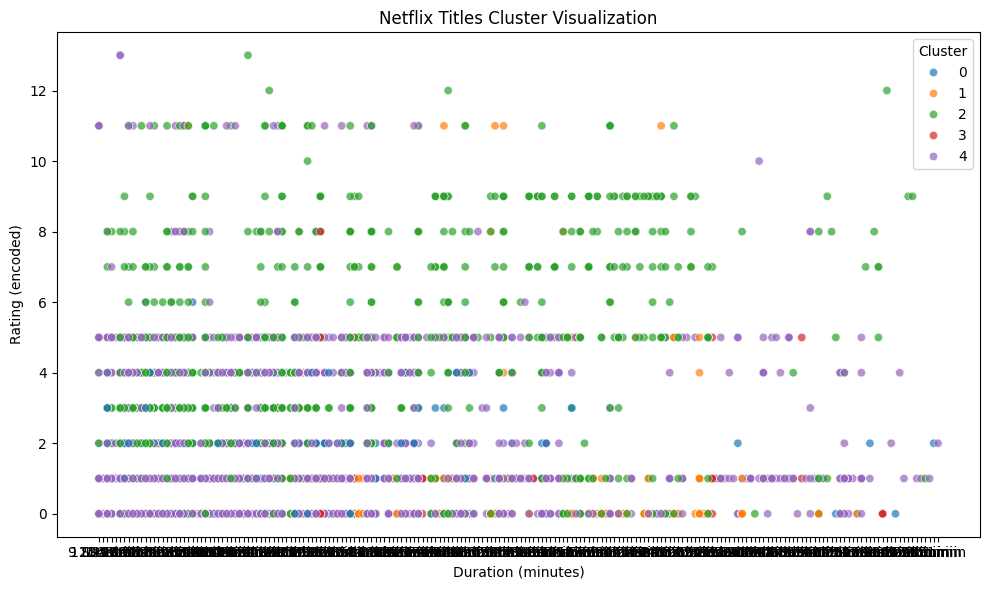

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df_read['duration'],
    y=df_read['rating'].map(rating_map),
    hue=df_read['cluster'],
    palette='tab10',
    alpha=0.7
)
plt.xlabel('Duration (minutes)')
plt.ylabel('Rating (encoded)')
plt.title('Netflix Titles Cluster Visualization')
plt.legend(title='Cluster')
plt.tight_layout()
display(plt.gcf())
plt.close()

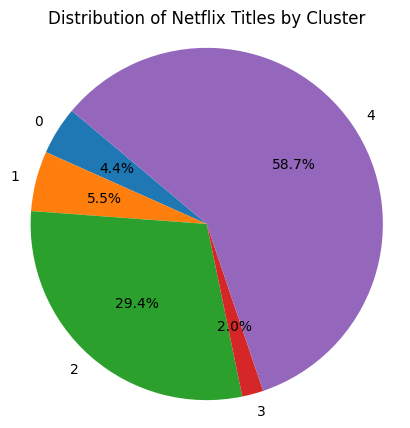

In [0]:
#visualize the clustering in pie chart
cluster_counts = df_read['cluster'].value_counts().sort_index()
plt.figure(figsize=(5, 5))
plt.pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('tab10', n_colors=len(cluster_counts)))
plt.title('Distribution of Netflix Titles by Cluster')
plt.axis('equal')
display(plt.gcf())
plt.close()

In [0]:
#cluster counts
df_read['cluster'].value_counts()

cluster
4    3130
2    1568
1     294
0     236
3     104
Name: count, dtype: int64

In [0]:
df_read['type'].value_counts()

type
Movie      5185
TV Show     147
Name: count, dtype: int64

In [0]:
#type
for c in sorted(df_read['cluster'].unique()):
    cluster_data = df_read[df_read['cluster'] == c]
    all_genres = cluster_data['listed_in'].str.split(', ').explode()
    top_genres = all_genres.value_counts()
    print(f"\nCluster {c}:")
    print(top_genres)


Cluster 0:
listed_in
Sci-Fi & Fantasy            236
Action & Adventure          125
International Movies         49
Dramas                       41
Thrillers                    36
Comedies                     31
Horror Movies                30
Children & Family Movies     22
Independent Movies           18
Romantic Movies               8
Anime Features                6
Cult Movies                   4
Sports Movies                 1
Music & Musicals              1
Classic Movies                1
Faith & Spirituality          1
Name: count, dtype: int64

Cluster 1:
listed_in
Stand-Up Comedy     294
Music & Musicals      6
Documentaries         2
Name: count, dtype: int64

Cluster 2:
listed_in
Children & Family Movies        477
Comedies                        462
Documentaries                   389
Action & Adventure              294
International Movies            200
Horror Movies                   170
Music & Musicals                138
Dramas                          120
Sports Mov

In [0]:
from sklearn.preprocessing import MultiLabelBinarizer

# Prepare genre features
mlb = MultiLabelBinarizer()
genres = df_read['listed_in'].str.split(', ')
genre_features = mlb.fit_transform(genres)

# Prepare duration feature
def extract_duration(row):
    if row['type'] == 'Movie':
        try:
            return int(str(row['duration']).split(' ')[0])
        except:
            return 0
    elif row['type'] == 'TV Show':
        try:
            return int(str(row['duration']).split(' ')[0]) * 60  # Approximate: 1 season = 60 min
        except:
            return 0
    else:
        return 0

duration_feature = df_read.apply(extract_duration, axis=1).values.reshape(-1, 1)
display(pd.DataFrame(genre_features, columns=mlb.classes_))
display(pd.DataFrame(duration_feature, columns=['duration']))


Action & Adventure,Anime Features,Anime Series,British TV Shows,Children & Family Movies,Classic & Cult TV,Classic Movies,Comedies,Crime TV Shows,Cult Movies,Documentaries,Docuseries,Dramas,Faith & Spirituality,Horror Movies,Independent Movies,International Movies,International TV Shows,Kids' TV,Korean TV Shows,LGBTQ Movies,Movies,Music & Musicals,Reality TV,Romantic Movies,Romantic TV Shows,Sci-Fi & Fantasy,Science & Nature TV,Spanish-Language TV Shows,Sports Movies,Stand-Up Comedy,Stand-Up Comedy & Talk Shows,TV Action & Adventure,TV Comedies,TV Dramas,TV Horror,TV Mysteries,TV Sci-Fi & Fantasy,TV Shows,TV Thrillers,Teen TV Shows,Thrillers
0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


duration
125
540
104
127
166
103
97
106
96
124


In [0]:
#Display all clusters at once
cluster_summary = (
    df_read.groupby('cluster') ['listed_in']
    .apply(lambda x:', ' .join(x))
    .str.split(', ')
    .explode()
    .value_counts()
    .reset_index()
    .rename(columns={'index': 'genre', 'listed_in': 'count'})
)
display(cluster_summary)

count,count
International Movies,2369
Dramas,2293
Comedies,1553
Action & Adventure,806
Independent Movies,740
Romantic Movies,579
Thrillers,547
Children & Family Movies,503
Documentaries,391
Horror Movies,336


In [0]:
# Assume y_test and y_pred are defined, e.g.:
# y_test = [...]
# y_pred = [...]

from sklearn.metrics import confusion_matrix
import pandas as pd

cm = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = cm.ravel()

results = pd.DataFrame({
    'Metric': [
        'True Positive',
        'True Negative',
        'False Positive',
        'False Negative'
    ],
    'Count': [
        tp,
        tn,
        fp,
        fn
    ]
})
display(results)

Metric,Count
True Positive,32
True Negative,1034
False Positive,1
False Negative,0


In [0]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
import re

# ------------------------------------------
# Step 1: Load Cleaned Dataset
# ------------------------------------------
df_read = pd.read_csv("/Volumes/workspace/default/netflix/NETFLIX_TITLES/cleaned_netflix_titles.csv")

# ------------------------------------------
# Step 2: Create 'content_age_years' if missing
# ------------------------------------------
if 'content_age_years' not in df_read.columns:
    if 'release_year' in df_read.columns:
        current_year = 2025  # you can replace with datetime.now().year
        df_read['content_age_years'] = current_year - df_read['release_year'].astype(int)
    elif 'date_added' in df_read.columns:
        # extract year from date_added if available
        df_read['release_year'] = pd.to_datetime(df_read['date_added'], errors='coerce').dt.year
        df_read['content_age_years'] = 2025 - df_read['release_year'].fillna(0).astype(int)
    else:
        # fallback if no date info is available
        df_read['content_age_years'] = 0

# ------------------------------------------
# Step 3: Create 'primary_genre' if missing
# ------------------------------------------
if 'primary_genre' not in df_read.columns:
    if 'listed_in' in df_read.columns:
        df_read['primary_genre'] = df_read['listed_in'].fillna('Unknown').astype(str).apply(lambda x: x.split(',')[0].strip())
    else:
        df_read['primary_genre'] = 'Unknown'

# ------------------------------------------
# Step 4: Prepare Features and Target
# ------------------------------------------
feature_cols = ['duration', 'rating', 'content_age_years', 'primary_genre']
df_features = df_read.copy()

# Encode categorical features
df_features['rating'] = df_features['rating'].astype('category').cat.codes
df_features['primary_genre'] = df_features['primary_genre'].astype('category').cat.codes

# Extract numeric duration (e.g., '90 min' -> 90)
df_features['duration'] = (
    df_features['duration']
    .astype(str)
    .str.extract(r'(\d+)')
    .astype(float)
    .fillna(0)
)

# Fill missing numeric values
df_features['content_age_years'] = df_features['content_age_years'].fillna(0)

# Features (X) and Target (Y)
X = df_features[feature_cols]
Y = df_features['type'].map({'Movie': 0, 'TV Show': 1})

# ------------------------------------------
# Step 5: Split Data
# ------------------------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.2, random_state=42
)

# ------------------------------------------
# Step 6: Train Classifier
# ------------------------------------------
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# ------------------------------------------
# Step 7: Predict and Evaluate
# ------------------------------------------
y_pred = clf.predict(X_test)
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=['Movie', 'TV Show']))



Classification Report:
              precision    recall  f1-score   support

       Movie       1.00      1.00      1.00      1035
     TV Show       0.97      1.00      0.98        32

    accuracy                           1.00      1067
   macro avg       0.98      1.00      0.99      1067
weighted avg       1.00      1.00      1.00      1067



In [0]:
counts = df_read['type'].value_counts()
display(counts)

type
Movie      5185
TV Show     147
Name: count, dtype: int64

Predicted Movie,Predicted TV Show
1034,1
0,32


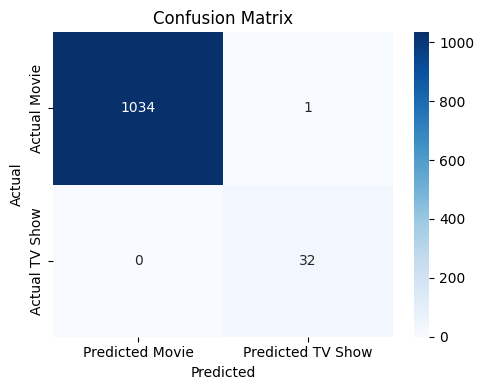

In [0]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

#Calculate confusion Matrix
cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(cm, index=['Actual Movie', 'Actual TV Show'], columns=['Predicted Movie', 'Predicted TV Show'])
display(cm_df)

plt.figure(figsize=(5,4))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.tight_layout()
display(plt.gcf())
plt.close()

In [0]:
from sklearn.metrics import confusion_matrix
#Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred)

#For binary classification: cm = [[true_negative, false_positive], [false_negative, true_positive]]
tn, fp, fn, tp = cm.ravel()
#Display results
import pandas as pd 
results = pd.DataFrame({
    'Metric': ['True Negative', 'False Positive', 'False Negative', 'True Positive'],
    'Value': [tn, fp, fn, tp]
})
display(results)


Metric,Value
True Negative,1034
False Positive,1
False Negative,0
True Positive,32


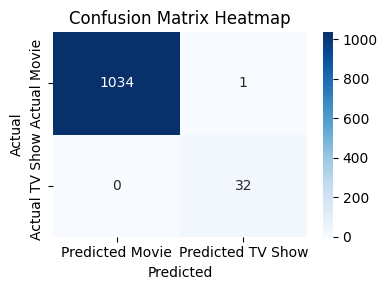

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

metrics = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
values = [tn, fp, fn, tp]
cm_matrix = np.array([[tn, fp], [fn, tp]])

plt.figure(figsize=(4, 3))
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Predicted Movie', 'Predicted TV Show'], yticklabels=['Actual Movie', 'Actual TV Show'])
plt.title('Confusion Matrix Heatmap')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.tight_layout()
display(plt.gcf())
plt.close()

In [0]:
if 'content_age_years' not in df_features.columns:
  df_features['content_age_years'] = df_features['content_age_years_year'].fillna(0)
else:
    df_features['content_age_years'] = 0  #fallback


In [0]:
# Take the first genre from 'listed_in' column
df_features['primary_genre'] = df_features['listed_in'].fillna('Unknown').astype(str).str.split(',').str[0]

# Encode genre and rating
df_features['primary_genre'] = df_features['primary_genre'].astype('category').cat.codes
df_features['rating'] = df_features['rating'].astype('category').cat.codes


In [0]:
feature_cols = ['duration', 'rating', 'content_age_years', 'primary_genre']
x = df_features[feature_cols]

#Encode target: Movie = 0, TV Show = 1
y = df_features['type'].map({'Movie': 0, 'TV Show': 1})


Feature,Importance
duration,0.9002370585788836
primary_genre,0.08961232403506451
rating,0.005678230962025249
content_age_years,0.004472386424026721


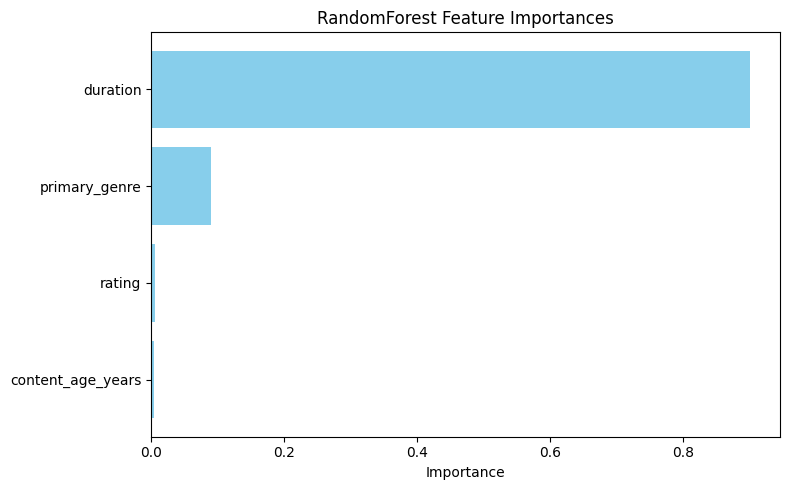

In [0]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Feature importance extraction
importances = clf.feature_importances_
feature_names = X.columns

# Create DataFrame for feature importances
feat_imp_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

display(feat_imp_df)

# Histogram visualization
plt.figure(figsize=(8, 5))
plt.barh(feat_imp_df['Feature'], feat_imp_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.title('RandomForest Feature Importances')
plt.gca().invert_yaxis()
plt.tight_layout()
display(plt.gcf())
plt.close()

In [0]:
# Make sure X is a DataFrame with proper column names
X = pd.DataFrame(X, columns=X.columns if hasattr(X, 'columns') else ['duration', 'rating', 'content_age_years', 'primary_genre'])

# Then compute feature importances
feat_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': clf.feature_importances_
}).sort_values(by='Importance', ascending=False)

display(feat_importance)


Feature,Importance
duration,0.9002370585788836
primary_genre,0.08961232403506451
rating,0.005678230962025249
content_age_years,0.004472386424026721


country,genre,title_count
Argentina,Action & Adventure,2
Argentina,Children & Family Movies,1
Argentina,Comedies,6
Argentina,Cult Movies,2
Argentina,Documentaries,2
Argentina,Dramas,14
Argentina,Horror Movies,2
Argentina,Independent Movies,2
Argentina,International Movies,25
Argentina,International TV Shows,1


country
United States     3351
India             2390
United Kingdom     361
Spain              235
Nigeria            231
Egypt              224
Japan              215
Canada             206
Turkey             204
Philippines        200
Name: title_count, dtype: int64

genre
International Movies        2369
Dramas                      2293
Comedies                    1553
Action & Adventure           806
Independent Movies           740
Romantic Movies              579
Thrillers                    547
Children & Family Movies     503
Documentaries                391
Horror Movies                336
Name: title_count, dtype: int64

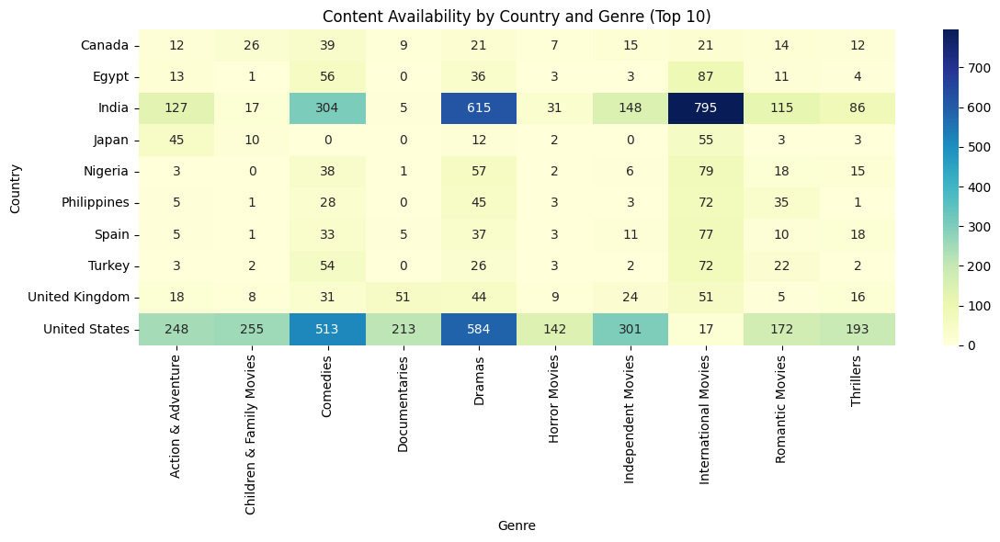

---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
~/.ipykernel/2471/command-7590306520997711-461730890 in ?()
     59         y_country = temp[f'is_available_in_{country}']
     60         if y_country.sum() > 0 and y_country.sum() < len(y_country):
     61             from sklearn.ensemble import RandomForestClassifier
     62             clf_country = RandomForestClassifier(n_estimators=50, random_state=42)
---> 63             clf_country.fit(X_country, y_country)
     64             importances = clf_country.feature_importances_
     65             feat_imp_df = pd.DataFrame({
     66                 'Feature': features,

/databricks/python_shell/lib/dbruntime/MLWorkloadsInstrumentation/_sklearn.py in ?(self, *args, **kwargs)
     31                 return original_result
     32             finally:
     33                 try:
     34                     if sess.should_log() and _

In [0]:
# Analyze key drivers for content availability across countries and genres

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure 'country' and 'listed_in' columns exist in the DataFrame
if 'country' in df_read.columns and 'listed_in' in df_read.columns:
    # Prepare data: explode countries and genres for per-country, per-genre analysis
    df_exploded = df_read.copy()
    df_exploded['country'] = df_exploded['country'].fillna('Unknown').astype(str)
    df_exploded['listed_in'] = df_exploded['listed_in'].fillna('Unknown').astype(str)
    df_exploded = df_exploded.assign(
        country=df_exploded['country'].str.split(','),
        genre=df_exploded['listed_in'].str.split(',')
    ).explode('country').explode('genre')
    df_exploded['country'] = df_exploded['country'].str.strip()
    df_exploded['genre'] = df_exploded['genre'].str.strip()

    # Group by country and genre, count available titles
    availability = (
        df_exploded.groupby(['country', 'genre'])
        .size()
        .reset_index(name='title_count')
    )

    # Top countries and genres by content count
    top_countries = (
        availability.groupby('country')['title_count']
        .sum()
        .sort_values(ascending=False)
        .head(10)
    )
    top_genres = (
        availability.groupby('genre')['title_count']
        .sum()
        .sort_values(ascending=False)
        .head(10)
    )

    display(availability)
    display(top_countries)
    display(top_genres)

    # Visualize: Heatmap of content availability by country and genre (top 10 of each)
    heatmap_data = (
        availability[
            availability['country'].isin(top_countries.index) &
            availability['genre'].isin(top_genres.index)
        ]
        .pivot(index='country', columns='genre', values='title_count')
        .fillna(0)
    )

    plt.figure(figsize=(12, 6))
    sns.heatmap(heatmap_data, annot=True, fmt='.0f', cmap='YlGnBu')
    plt.title('Content Availability by Country and Genre (Top 10)')
    plt.ylabel('Country')
    plt.xlabel('Genre')
    plt.tight_layout()
    display(plt.gcf())
    plt.close()

    # Feature importance: Predicting if a title is available in a top country
    from sklearn.ensemble import RandomForestClassifier

    for country in top_countries.index:
        df_exploded[f'is_available_in_{country}'] = (df_exploded['country'] == country).astype(int)
        temp = df_exploded.copy()
        temp['genre_code'] = temp['genre'].astype('category').cat.codes
        temp['rating_code'] = temp['rating'].astype('category').cat.codes if 'rating' in temp.columns else 0

        # Create content_age_years if missing
        if 'content_age_years' not in temp.columns:
            if 'release_year' in temp.columns:
                temp['content_age_years'] = 2025 - temp['release_year'].astype(float).fillna(0)
            else:
                temp['content_age_years'] = 0

        # Extract numeric duration
        temp['duration'] = (
            temp['duration']
            .astype(str)
            .str.extract(r'(\d+)')
            .astype(float)
            .fillna(0)
        )

        # Define features and target
        features = ['duration', 'rating_code', 'content_age_years', 'genre_code']
        temp[features] = temp[features].apply(pd.to_numeric, errors='coerce').fillna(0)

        X_country = temp[features]
        y_country = temp[f'is_available_in_{country}']

        # Check for valid data
        if len(X_country) == 0 or y_country.sum() == 0 or y_country.sum() == len(y_country):
            print(f"Skipping {country} (insufficient variation in data)")
            continue

        # Train Random Forest Classifier safely
        clf_country = RandomForestClassifier(n_estimators=50, random_state=42)
        clf_country.fit(X_country, y_country)

        # Feature importance
        importances = clf_country.feature_importances_
        feat_imp_df = pd.DataFrame({
            'Feature': features,
            'Importance': importances
        }).sort_values(by='Importance', ascending=False)

        print(f"\nFeature importances for content availability in {country}:")
        display(feat_imp_df)

In [0]:
# Create content_age_years if missing
if 'content_age_years' not in df_exploded.columns:
    if 'release_year' in df_exploded.columns:
        current_year = 2025
        df_exploded['content_age_years'] = current_year - df_exploded['release_year'].astype(float).fillna(0)
    else:
        df_exploded['content_age_years'] = 0


In [0]:
# Feature importance: Predicting if a title is available in a top country
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import numpy as np

for country in top_countries.index:
    df_exploded[f'is_available_in_{country}'] = (df_exploded['country'] == country).astype(int)
    
    # Make a copy for processing
    temp = df_exploded.copy()

    # Encode genre and rating
    temp['genre_code'] = temp['genre'].astype('category').cat.codes
    temp['rating_code'] = temp['rating'].astype('category').cat.codes if 'rating' in temp.columns else 0

    # Create content_age_years if missing
    if 'content_age_years' not in temp.columns:
        if 'release_year' in temp.columns:
            temp['content_age_years'] = 2025 - temp['release_year'].astype(float).fillna(0)
        else:
            temp['content_age_years'] = 0

    # Extract numeric duration
    temp['duration'] = (
        temp['duration']
        .astype(str)
        .str.extract(r'(\d+)')
        .astype(float)
        .fillna(0)
    )

    # Define features and target
    features = ['duration', 'rating_code', 'content_age_years', 'genre_code']
    temp[features] = temp[features].apply(pd.to_numeric, errors='coerce').fillna(0)

    X_country = temp[features]
    y_country = temp[f'is_available_in_{country}']

    # Check for valid data
    if len(X_country) == 0 or y_country.sum() == 0 or y_country.sum() == len(y_country):
        print(f"Skipping {country} (insufficient variation in data)")
        continue

    # Train Random Forest Classifier safely
    clf_country = RandomForestClassifier(n_estimators=50, random_state=42)
    clf_country.fit(X_country, y_country)

    # Feature importance
    importances = clf_country.feature_importances_
    feat_imp_df = pd.DataFrame({
        'Feature': features,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)

    print(f"\nFeature importances for content availability in {country}:")
    display(feat_imp_df)



Feature importances for content availability in United States:


Feature,Importance
duration,0.3817293432215059
rating_code,0.218873028245894
content_age_years,0.21408141360602964
genre_code,0.18531621492657052



Feature importances for content availability in India:


Feature,Importance
duration,0.5282092677559632
rating_code,0.19518368410342762
content_age_years,0.19156737827513098
genre_code,0.0850396698654781



Feature importances for content availability in United Kingdom:


Feature,Importance
duration,0.434097666816034
content_age_years,0.24811732264584976
genre_code,0.2138380491533559
rating_code,0.10394696138476034



Feature importances for content availability in Spain:


Feature,Importance
duration,0.5232421912398627
content_age_years,0.22351693551930313
genre_code,0.19580108173232122
rating_code,0.05743979150851301



Feature importances for content availability in Nigeria:


Feature,Importance
duration,0.5249645331156875
content_age_years,0.24526252455725017
genre_code,0.15993813263654505
rating_code,0.06983480969051724



Feature importances for content availability in Egypt:


Feature,Importance
duration,0.5105685117194311
content_age_years,0.27935580423680273
genre_code,0.1302116615156876
rating_code,0.07986402252807856



Feature importances for content availability in Japan:


Feature,Importance
duration,0.3698635961619323
genre_code,0.29611245230581573
content_age_years,0.22828414247966058
rating_code,0.10573980905259132



Feature importances for content availability in Canada:


Feature,Importance
duration,0.4276190313295942
content_age_years,0.21613660881761868
genre_code,0.20843563491517345
rating_code,0.14780872493761366



Feature importances for content availability in Turkey:


Feature,Importance
duration,0.4297080445772919
content_age_years,0.29312171729883874
genre_code,0.1542880652886178
rating_code,0.12288217283525153



Feature importances for content availability in Philippines:


Feature,Importance
duration,0.47344082711115343
content_age_years,0.2673364060642658
genre_code,0.16291142236329054
rating_code,0.09631134446129018


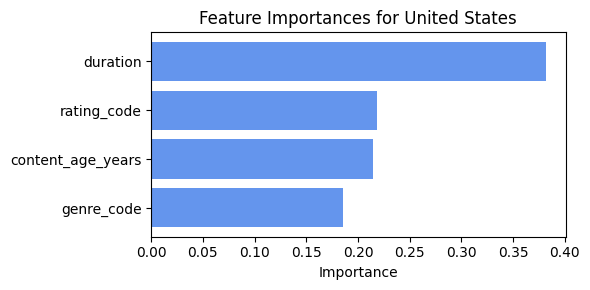

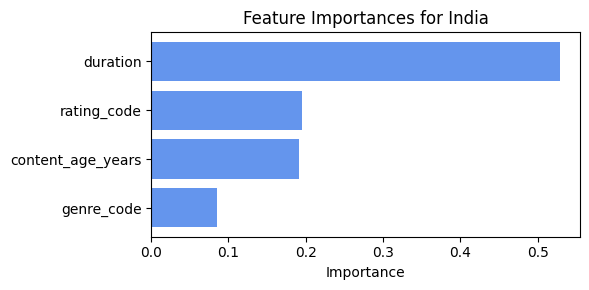

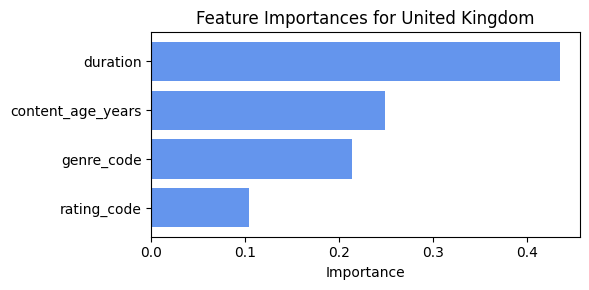

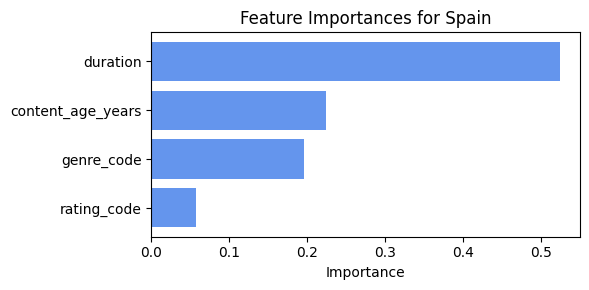

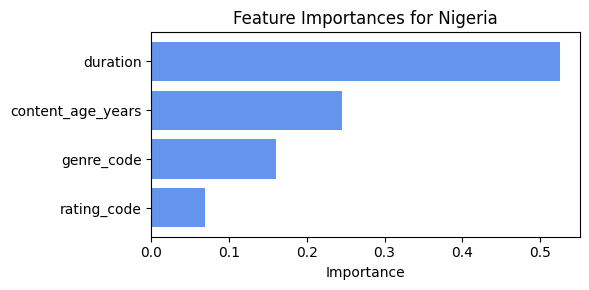

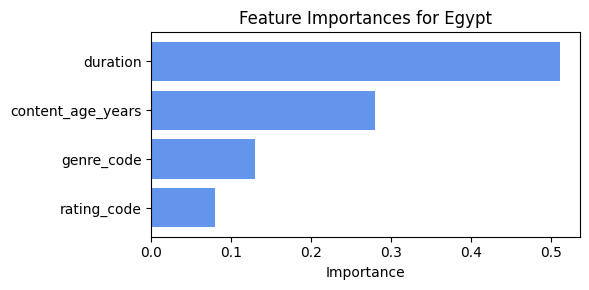

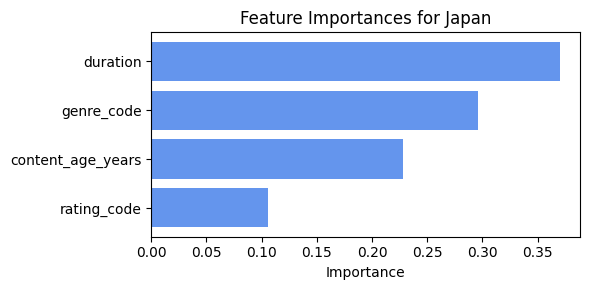

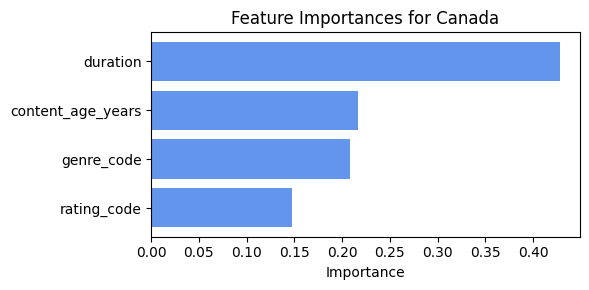

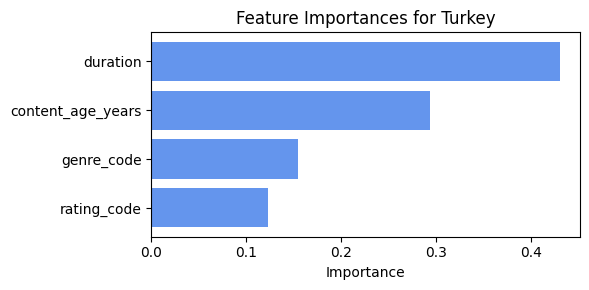

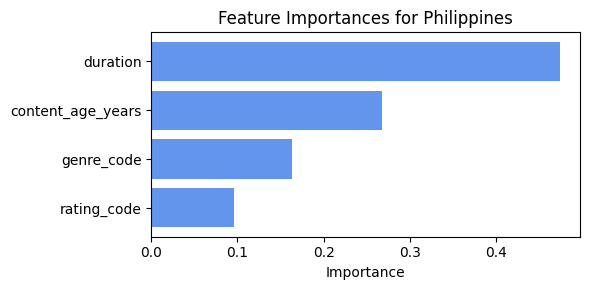

In [0]:
import matplotlib.pyplot as plt

for country in top_countries.index:
    temp = df_exploded.copy()
    temp['genre_code'] = temp['genre'].astype('category').cat.codes
    temp['rating_code'] = temp['rating'].astype('category').cat.codes if 'rating' in temp.columns else 0
    if 'content_age_years' not in temp.columns:
        if 'release_year' in temp.columns:
            temp['content_age_years'] = 2025 - temp['release_year'].astype(float).fillna(0)
        else:
            temp['content_age_years'] = 0
    temp['duration'] = temp['duration'].astype(str).str.extract(r'(\d+)').astype(float).fillna(0)
    features = ['duration', 'rating_code', 'content_age_years', 'genre_code']
    temp[features] = temp[features].apply(pd.to_numeric, errors='coerce').fillna(0)
    X_country = temp[features]
    y_country = (temp['country'] == country).astype(int)
    if len(X_country) == 0 or y_country.sum() == 0 or y_country.sum() == len(y_country):
        continue
    clf_country = RandomForestClassifier(n_estimators=50, random_state=42)
    clf_country.fit(X_country, y_country)
    importances = clf_country.feature_importances_
    feat_imp_df = pd.DataFrame({
        'Feature': features,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)
    plt.figure(figsize=(6, 3))
    plt.barh(feat_imp_df['Feature'], feat_imp_df['Importance'], color='cornflowerblue')
    plt.xlabel('Importance')
    plt.title(f'Feature Importances for {country}')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    display(plt.gcf())
    plt.close()

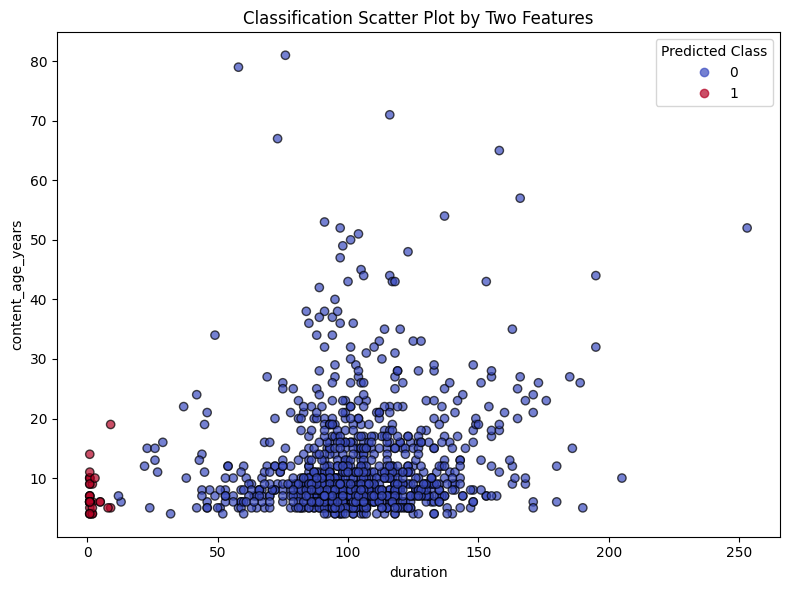

In [0]:
import matplotlib.pyplot as plt

# Select two features for visualization, e.g., 'duration' and 'content_age_years'
feature_x = 'duration'
feature_y = 'content_age_years'

plt.figure(figsize=(8, 6))
scatter = plt.scatter(
    X_test[feature_x],
    X_test[feature_y], 
    c=y_pred, 
    cmap='coolwarm', 
    alpha=0.7, 
    edgecolor='k'
)
plt.xlabel(feature_x)
plt.ylabel(feature_y)
plt.title('Classification Scatter Plot by Two Features')
plt.legend(*scatter.legend_elements(), title="Predicted Class", loc="best")
plt.tight_layout()
display(plt.gcf())
plt.close()

Classification Report:
              precision    recall  f1-score   support

       Movie       1.00      1.00      1.00      1035
     TV Show       0.97      1.00      0.98        32

    accuracy                           1.00      1067
   macro avg       0.98      1.00      0.99      1067
weighted avg       1.00      1.00      1.00      1067



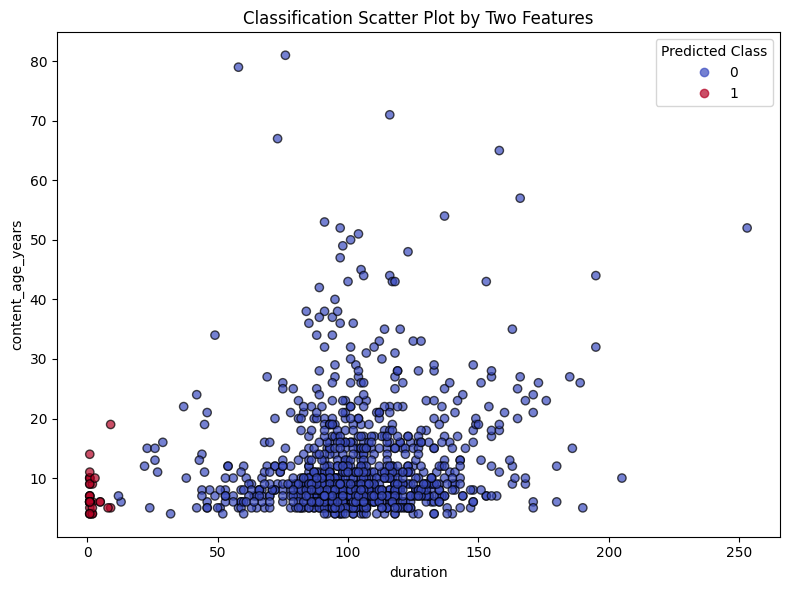

In [0]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Step 1: Load your cleaned dataset
df_read = pd.read_csv("/Volumes/workspace/default/netflix/NETFLIX_TITLES/cleaned_netflix_titles.csv")

# Step 2: Prepare features
df_read['duration'] = (
    df_read['duration']
    .astype(str)
    .str.extract(r'(\d+)')
    .astype(float)
    .fillna(0)
)
df_read['rating'] = df_read['rating'].astype('category').cat.codes

# Create content_age_years if not present
if 'content_age_years' not in df_read.columns:
    if 'release_year' in df_read.columns:
        df_read['content_age_years'] = 2025 - df_read['release_year'].astype(int)
    else:
        df_read['content_age_years'] = 0

# Extract primary genre
if 'primary_genre' not in df_read.columns and 'listed_in' in df_read.columns:
    df_read['primary_genre'] = df_read['listed_in'].fillna('Unknown').astype(str).str.split(',').str[0]

df_read['primary_genre'] = df_read['primary_genre'].astype('category').cat.codes

# Step 3: Define Features (X) and Target (y)
X = df_read[['duration', 'rating', 'content_age_years', 'primary_genre']]
y = df_read['type'].map({'Movie': 0, 'TV Show': 1})  # Encode target

# Step 4: Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Step 5: Train the model
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Step 6: Predict and evaluate
y_pred = clf.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=['Movie', 'TV Show']))

# Step 7: Visualization — Scatter plot
feature_x = 'duration'
feature_y = 'content_age_years'

plt.figure(figsize=(8, 6))
scatter = plt.scatter(
    X_test[feature_x],
    X_test[feature_y],
    c=y_pred,
    cmap='coolwarm',
    alpha=0.7,
    edgecolor='k'
)
plt.xlabel(feature_x)
plt.ylabel(feature_y)
plt.title('Classification Scatter Plot by Two Features')
plt.legend(*scatter.legend_elements(), title="Predicted Class", loc="best")
plt.tight_layout()
plt.show()


In [0]:
# Calculate % of movies vs tv shows by country
df_country_type = (
    df_read.copy()
    .assign(country=df_read['country'].fillna('Unknown').astype(str).str.split(','))
    .explode('country')
)
df_country_type['country'] = df_country_type['country'].str.strip()

country_counts = (
    df_country_type.groupby(['country', 'type'])
    .size()
    .reset_index(name='count')
)

total_per_country = (
    country_counts.groupby('country')['count']
    .sum()
    .reset_index(name='total')
)

country_pct = (
    country_counts
    .merge(total_per_country, on='country')
    .assign(percent=lambda x: (x['count'] / x['total']) * 100)
    .pivot(index='country', columns='type', values='percent')
    .fillna(0)
    .reset_index()
)

display(country_pct)

country,Movie,TV Show
Argentina,97.14285714285714,2.857142857142857
Argentina Brazil France Poland Germany Denmark,100.0,0.0
Argentina Chile,100.0,0.0
Argentina Chile Peru,100.0,0.0
Argentina France,100.0,0.0
Argentina France United States Germany Qatar,100.0,0.0
Argentina Spain,100.0,0.0
Argentina United States,100.0,0.0
Argentina Uruguay Serbia,100.0,0.0
Argentina Uruguay Spain France,100.0,0.0


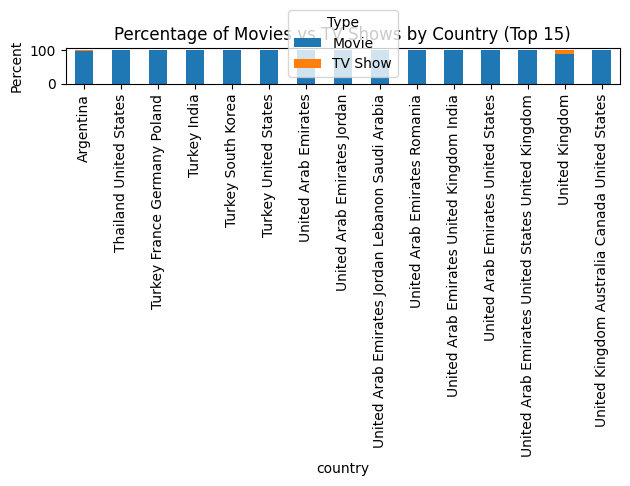

<Figure size 1200x600 with 0 Axes>

In [0]:
import matplotlib.pyplot as plt

# Plot stacked bar chart for % of Movies vs TV Shows by country (top 15 countries by total titles)
top_countries = (
    country_pct.set_index('country')
    .sum(axis=1)
    .sort_values(ascending=False)
    .head(15)
    .index
)

plot_data = country_pct[country_pct['country'].isin(top_countries)].set_index('country')
plot_data = plot_data[['Movie', 'TV Show']].fillna(0)

plt.figure(figsize=(12, 6))
plot_data.plot(kind='bar', stacked=True, color=['#1f77b4', '#ff7f0e'])
plt.ylabel('Percent')
plt.title('Percentage of Movies vs TV Shows by Country (Top 15)')
plt.legend(title='Type')
plt.tight_layout()
display(plt.gcf())
plt.close()

release_year,title_count,period
1942,1,Before 2015
1944,1,Before 2015
1945,1,Before 2015
1946,1,Before 2015
1947,1,Before 2015
1954,2,Before 2015
1955,3,Before 2015
1956,2,Before 2015
1958,3,Before 2015
1959,1,Before 2015


period,title_count
2015 & After,3353
Before 2015,1979


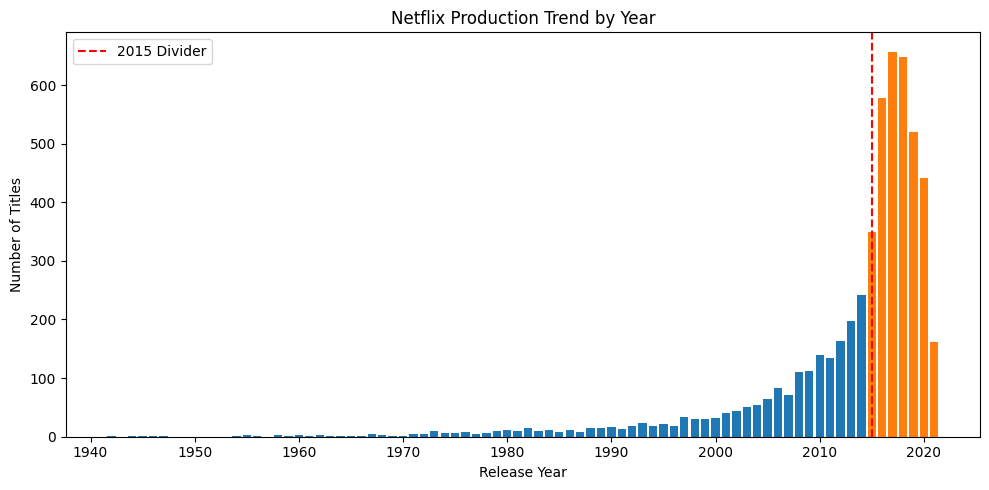

In [0]:
# netflix production trend before and after 2015
import pandas as pd
import matplotlib.pyplot as plt

# Ensure 'release_year' column exists
if 'release_year' not in df_read.columns and 'date_added' in df_read.columns:
    df_read['release_year'] = pd.to_datetime(df_read['date_added'], errors='coerce').dt.year

# Filter valid years
df_read['release_year'] = pd.to_numeric(df_read['release_year'], errors='coerce')
df_trend = df_read.dropna(subset=['release_year'])

# Group by year and count titles
yearly_counts = (
    df_trend.groupby('release_year')
    .size()
    .reset_index(name='title_count')
    .sort_values('release_year')
)

# Mark before/after 2015
yearly_counts['period'] = yearly_counts['release_year'].apply(lambda x: 'Before 2015' if x < 2015 else '2015 & After')

# Aggregate counts by period
period_counts = (
    yearly_counts.groupby('period')['title_count']
    .sum()
    .reset_index()
)

display(yearly_counts)
display(period_counts)

# Visualization
plt.figure(figsize=(10, 5))
plt.bar(yearly_counts['release_year'], yearly_counts['title_count'], color=['#1f77b4' if y < 2015 else '#ff7f0e' for y in yearly_counts['release_year']])
plt.axvline(2015, color='red', linestyle='--', label='2015')
plt.xlabel('Release Year')
plt.ylabel('Number of Titles')
plt.title("Netflix Production Trend by Year")
plt.legend(['2015 Divider'])
plt.tight_layout()
display(plt.gcf())
plt.close()